In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

/Users/oskarhaupt/Library/Python/3.9/lib/python/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


## Simple UMAP without Complex Preprocessing (since my GSEA is always looking shitty)


In [5]:
# Simple UMAP for CellBender data - minimal preprocessing
simple_adata = sc.read_10x_h5('/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/GSEA_cellbender/data/emptydrops_all_detected_cells_cellbender.h5')

print(f"Original shape: {simple_adata.shape}")

# Minimal QC - just remove obvious empty cells
sc.pp.calculate_qc_metrics(simple_adata, inplace=True)

# Very basic filtering (optional - comment out if you want truly raw)
# sc.pp.filter_cells(simple_adata, min_genes=200)
# sc.pp.filter_genes(simple_adata, min_cells=3)

# Basic normalization
sc.pp.normalize_total(simple_adata, target_sum=1e4)
sc.pp.log1p(simple_adata)

# Use all genes or top variable genes (uncomment one approach)
# Option 1: Use ALL genes
# sc.pp.pca(simple_adata, n_comps=50, use_highly_variable=False)

# Option 2: Select HVGs (less aggressive than your pipeline)
sc.pp.highly_variable_genes(simple_adata, n_top_genes=3000)
sc.pp.pca(simple_adata, n_comps=50)

# Generate UMAP
sc.pp.neighbors(simple_adata, n_neighbors=15, n_pcs=30)
sc.tl.umap(simple_adata, min_dist=0.3)

# Optional: add leiden clustering for coloring
sc.tl.leiden(simple_adata, resolution=0.5)

print(f"Final shape: {simple_adata.shape}")
print(f"Generated UMAP with minimal preprocessing")


Original shape: (12315, 22040)
Final shape: (12315, 22040)
Generated UMAP with minimal preprocessing


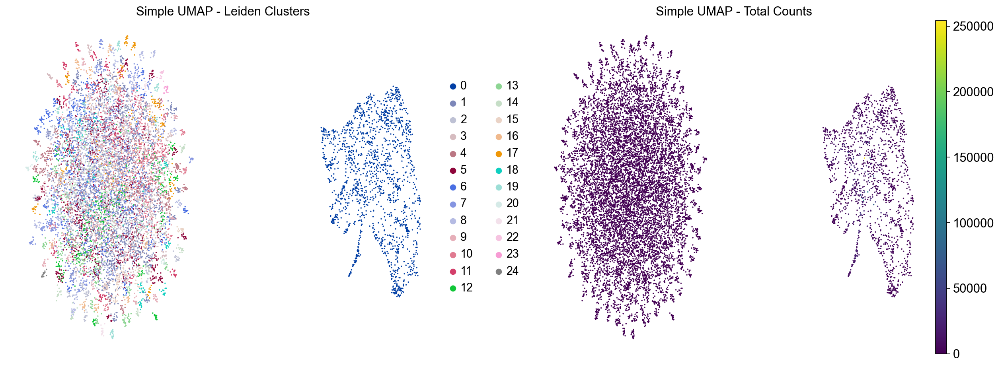


Available obs columns: ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden']


In [6]:
# Visualize simple UMAP
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Color by leiden clusters
sc.pl.umap(simple_adata, color='leiden', ax=axes[0], show=False, title='Simple UMAP - Leiden Clusters')

# Color by total counts (QC metric)
sc.pl.umap(simple_adata, color='total_counts', ax=axes[1], show=False, title='Simple UMAP - Total Counts')

plt.tight_layout()
plt.show()

# Also check some marker genes if available
print("\nAvailable obs columns:", list(simple_adata.obs.columns))


In [ ]:
# Optional: Check key spermatogenesis markers on simple UMAP
marker_genes = ['DMRT1', 'STRA8', 'SYCP1', 'SYCP3', 'PRM1', 'PRM2', 'TNP1', 'ACRV1']
available_markers = [gene for gene in marker_genes if gene in simple_adata.var_names]

print(f"Available markers: {available_markers}")

if len(available_markers) > 0:
    sc.pl.umap(simple_adata, color=available_markers, ncols=4, cmap='viridis')


Available markers: ['DMRT1', 'STRA8', 'SYCP1', 'SYCP3', 'PRM1', 'PRM2', 'TNP1', 'ACRV1']


# an = ED_cellbender

In [ ]:
# 
import sys
sys.path.insert(1, '/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/GSEA_new')
from gene_pathway_analysis import SpermatogenesisAnalyzer # main file for GSEA analysis. creates h5ad file with GSEA processed data

Output directory created: GSEA_20251020_224841
Defined 29 trajectory markers of germ cells (5 categories)
Cell type markers: 62 total including leydig/sertoli etc
Original data shape: (12315, 22040)
Data loaded and QC metrics calculated


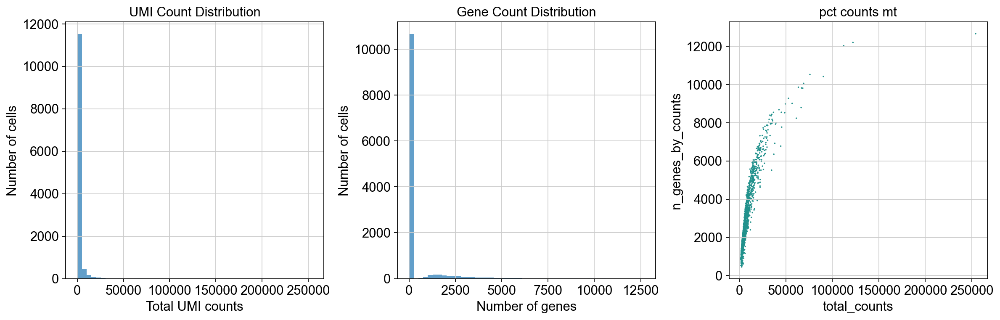


NORMALIZATION & SCALING
Parameters saved to: GSEA_20251020_224841/parameters.txt
NO custom hvg filter but just for your information:
Highly variable genes: 4011


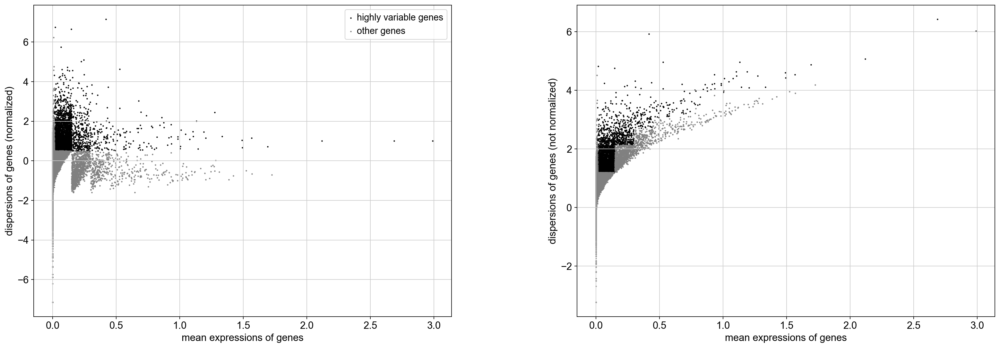

In data available spermatogenesis markers: 26/29
Markers not found in data: {'DMRT6', 'SOHLH1', 'UTF1'}
HVG spermatogenesis markers: 12
Top 12 HVG: ['DMRT1', 'SOHLH2', 'STRA8', 'SYCP1', 'HORMAD2', 'TEX101', 'TNP1', 'TNP2', 'ACRV1', 'SPATA16', 'PRM1', 'PRM2']

ADVANCED DIMENSIONALITY REDUCTION


Compute diffusion-based UMAP: 100%|██████████| 4/4 [00:56<00:00, 14.24s/step]



SPERMATOGENESIS TRAJECTORY INFERENCE
Root cluster set: 16

GSEA PATHWAY ANALYSIS
Progression groups: progression_group
EARLY    11130
LATE      1185
Name: count, dtype: int64
(1/1) Running GSEA with GO_Biological_Process_2023...
   -> 2410 pathways found

TOP PATHWAYS (first database):
                                                Term        ES       NES  \
0  Energy Derivation By Oxidation Of Organic Comp...  0.774594   2.24733   
1        Antimicrobial Humoral Response (GO:0019730)  0.546872  2.214024   
2  Antimicrobial Humoral Immune Response Mediated...  0.613611  2.177873   
3             Cellular Response To Heat (GO:0034605)   0.64585  2.097224   
4      Regulation Of Protein Processing (GO:0070613)  0.672894  2.092501   
5  Negative Regulation Of mRNA Catabolic Process ...   0.59567  2.086201   
6    Macromolecule Biosynthetic Process (GO:0009059)  0.696577  2.081036   
7    Regulation Of Protein Localization (GO:0032880)  0.495001  2.069002   
8  Positive Regulation Of Re

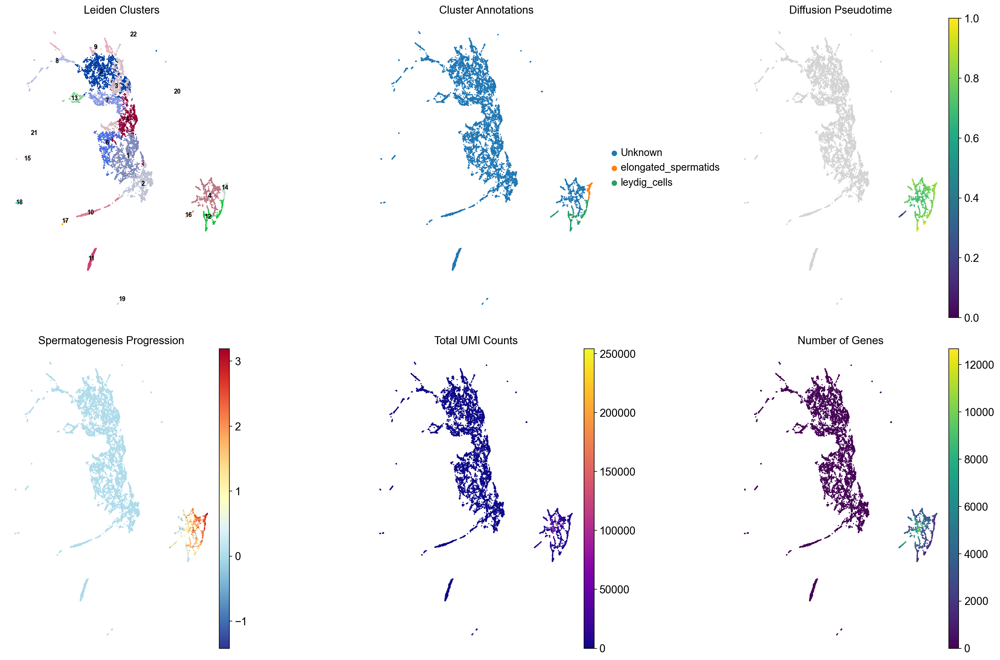


Creating cluster-specific marker plots...
!!!! No markers available for cluster 0
!!!! No markers available for cluster 1
!!!! No markers available for cluster 10
!!!! No markers available for cluster 11


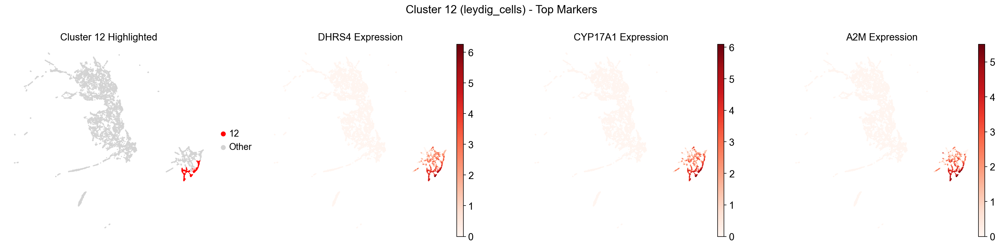

!!!! No markers available for cluster 13


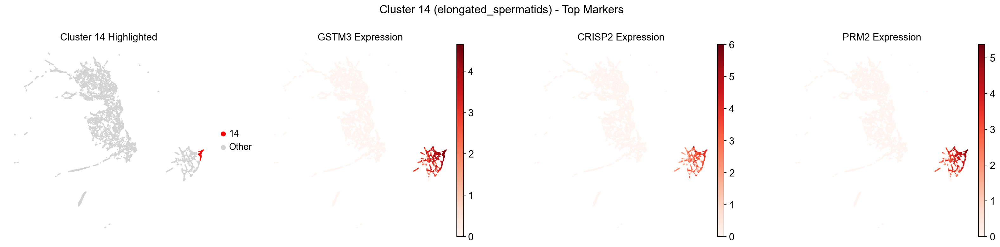

!!!! No markers available for cluster 15


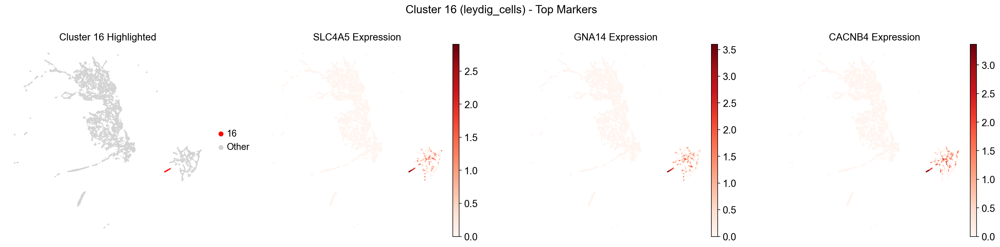

!!!! No markers available for cluster 17
!!!! No markers available for cluster 18
!!!! No markers available for cluster 19
!!!! No markers available for cluster 2
!!!! No markers available for cluster 20
!!!! No markers available for cluster 21
!!!! No markers available for cluster 22
!!!! No markers available for cluster 3


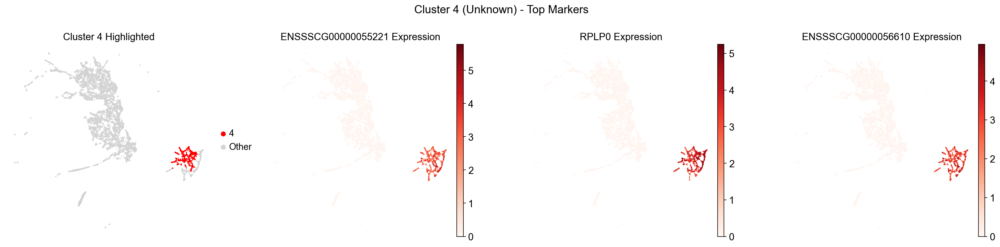

!!!! No markers available for cluster 5
!!!! No markers available for cluster 6
!!!! No markers available for cluster 7
!!!! No markers available for cluster 8
!!!! No markers available for cluster 9


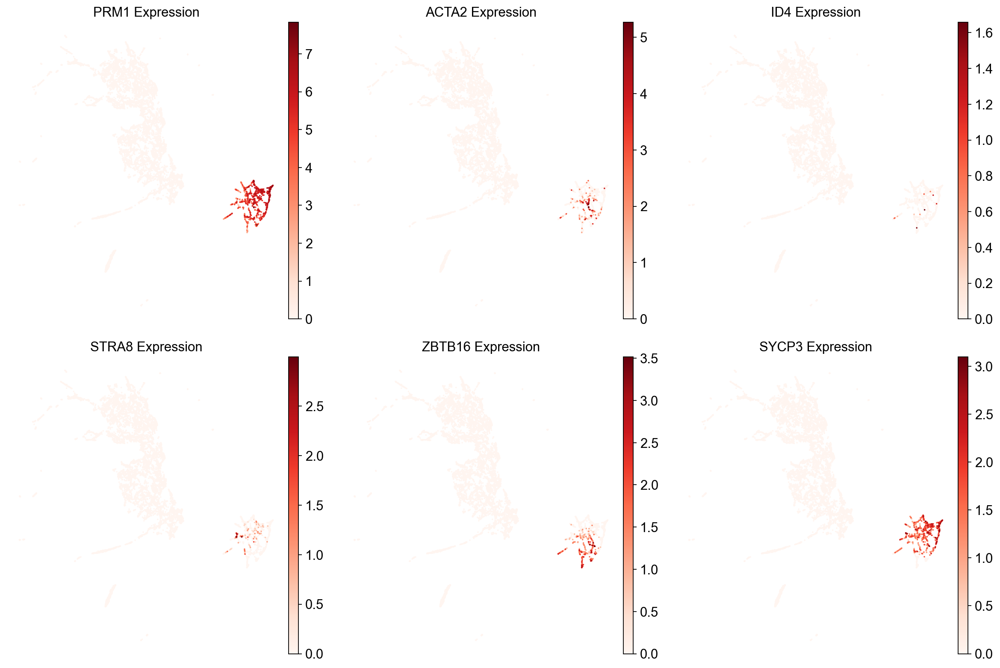

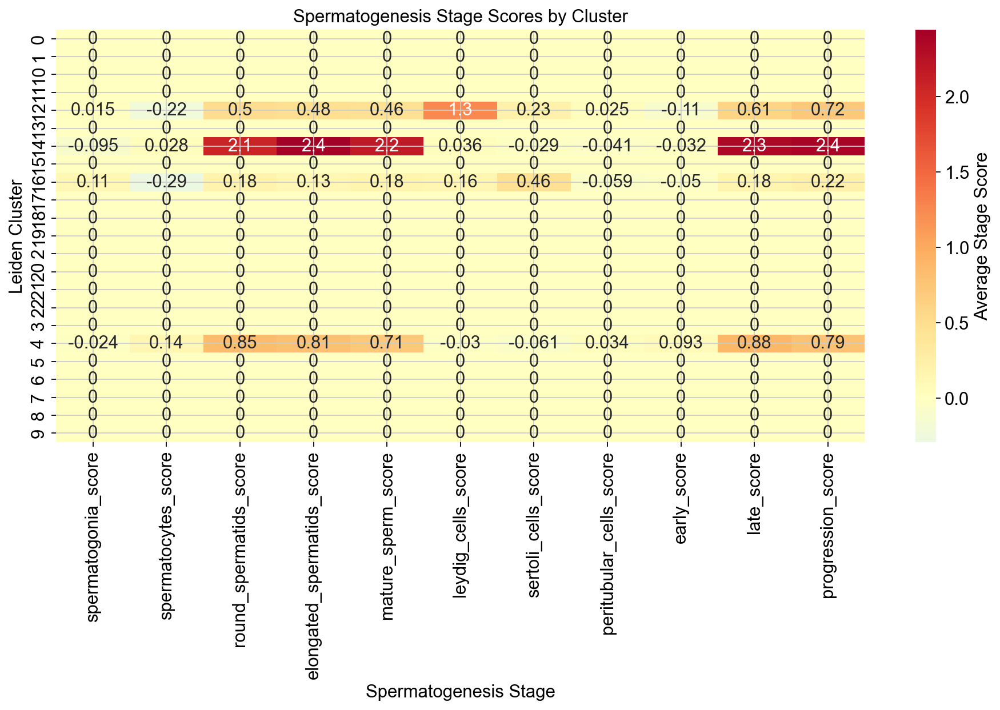

ValueError: supplied range of [0.0, inf] is not finite

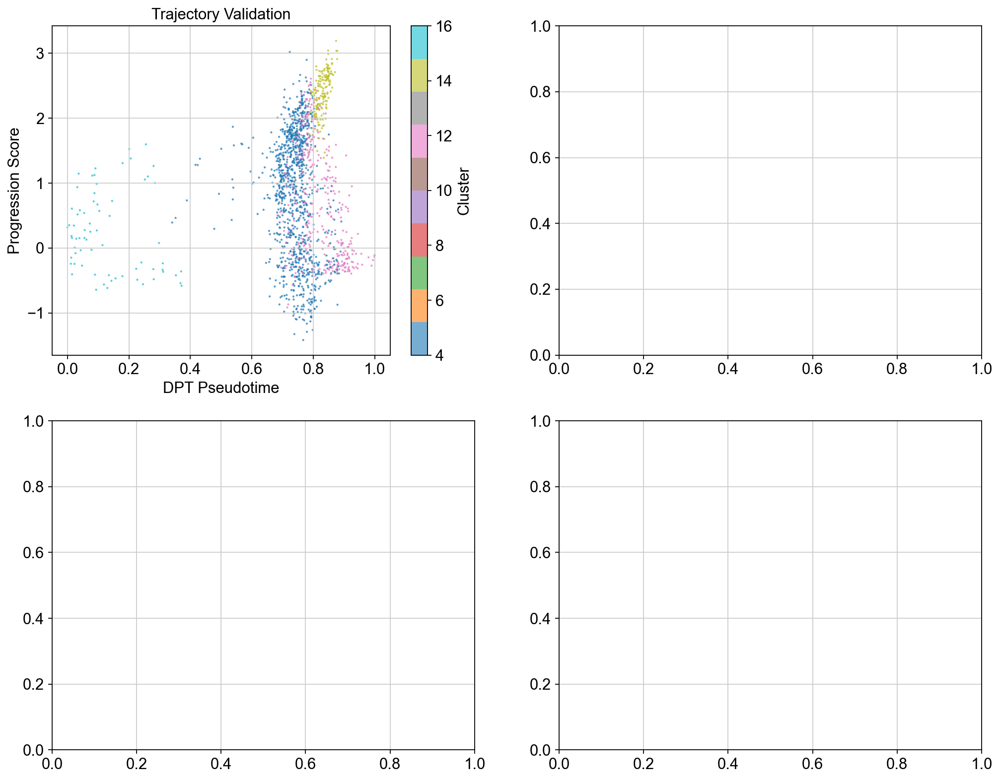

In [3]:

an = SpermatogenesisAnalyzer(data_path='/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/GSEA_cellbender/data/emptydrops_all_detected_cells_cellbender.h5')
adata = an.run_complete_analysis()
an.export_results(output_dir='spermatogenesis_analysis_results_cellbender')


# bn = emptydrops orig

🧬 Defined 54 trajectory markers
📊 Cell type markers: 78 total
🚀 STARTING COMPREHENSIVE SPERMATOGENESIS ANALYSIS
📁 Loading data from: /Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/data/emptydrops_all_detected_cells.h5ad
📊 Original data shape: (12315, 22040)
✅ Data loaded and QC metrics calculated

🔍 ADVANCED FILTERING
Original: 12315 cells × 22040 genes
After min_genes filter: 10064 cells
After gene filter: 17524 genes
✅ Final filtered data: 7493 cells × 17524 genes


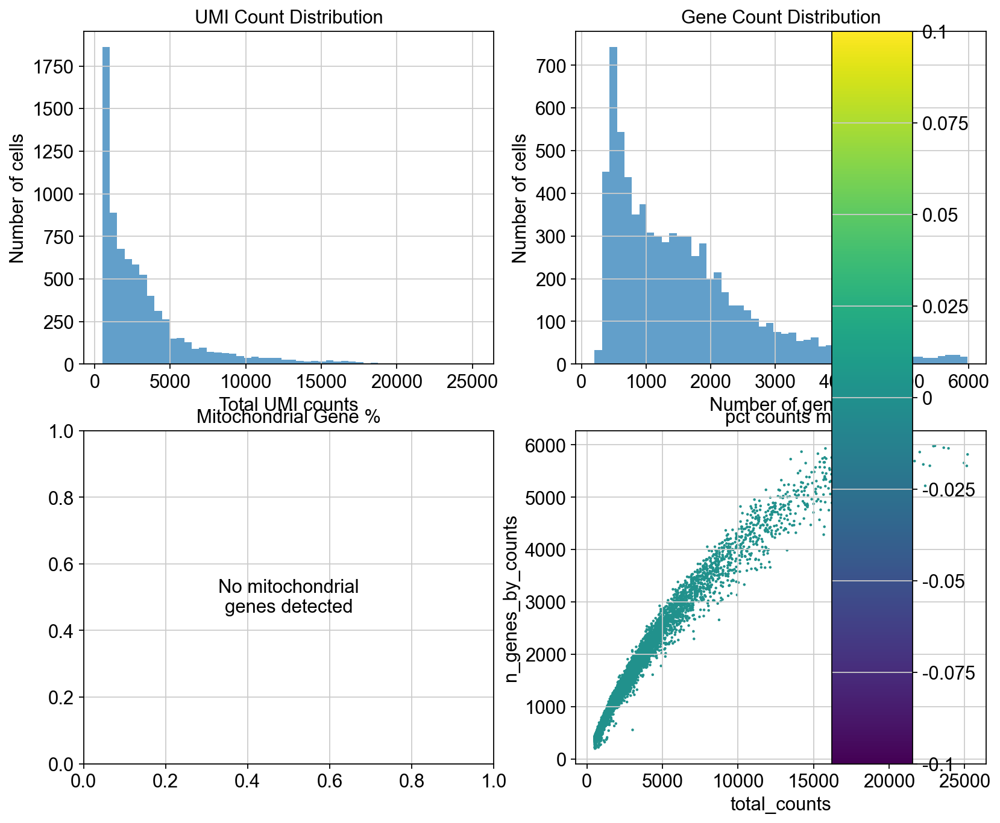

<Figure size 960x640 with 0 Axes>


🔧 NORMALIZATION & SCALING
📊 Highly variable genes: 3000


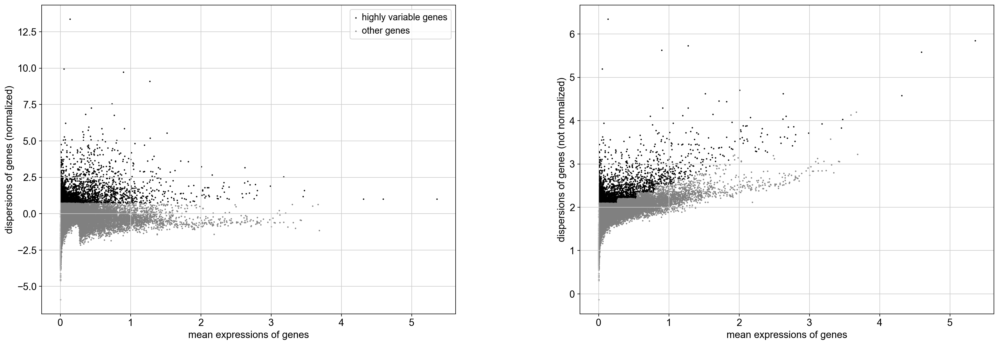

🧬 Available spermatogenesis markers: 41
🎯 HVG spermatogenesis markers: 16
Key HVG markers: ['ID4', 'NANOS3', 'KIT', 'SYCP1', 'SMC1B', 'HORMAD2', 'DMC1', 'CCNA1', 'CCNB1', 'PRM1']
✅ Normalized and scaled: 3025 features

🌟 ADVANCED DIMENSIONALITY REDUCTION
🔄 Computing diffusion maps...
🕸️ Computing PAGA...
🗺️ Computing UMAP with PAGA initialization...
🌊 Computing diffusion-based UMAP...
✅ Dimensionality reduction completed

🧬 SPERMATOGENESIS TRAJECTORY INFERENCE
📊 spermatogonia: 7 markers available
📊 spermatocytes: 13 markers available
📊 round_spermatids: 9 markers available
📊 elongating_spermatids: 10 markers available
📊 mature_sperm: 5 markers available
📊 sertoli_cells: 2 markers available
📊 leydig_cells: 3 markers available
📊 peritubular_cells: 5 markers available
🌱 Root cluster set: 13
✅ Trajectory inference completed

🧪 GSEA PATHWAY ANALYSIS
📊 Progression groups: progression_group
EARLY    3747
LATE     3746
Name: count, dtype: int64
🔍 Running GSEA with GO_Biological_Process_2023...

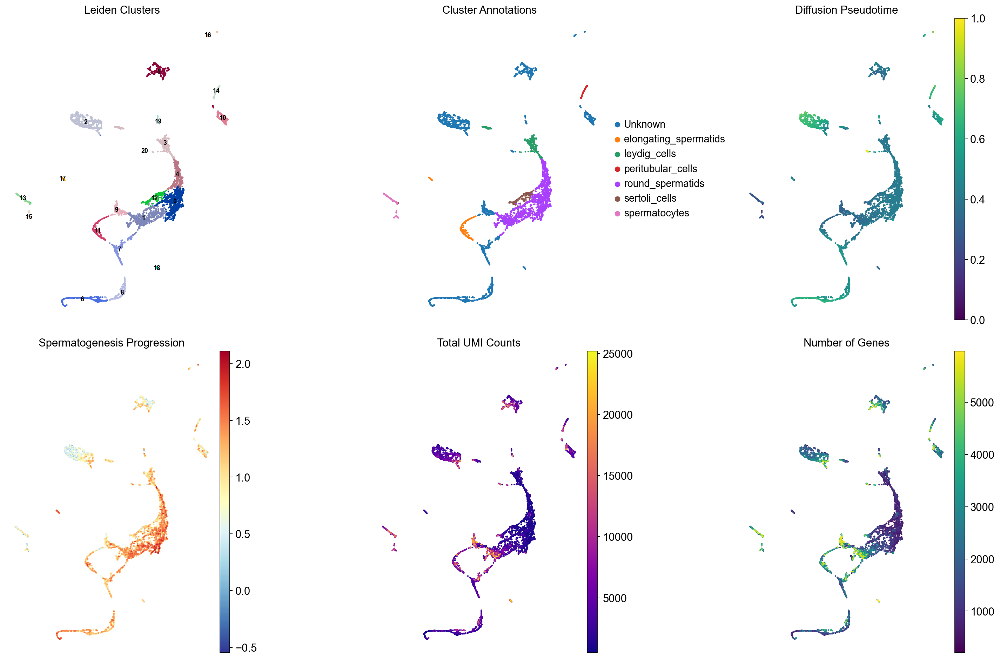

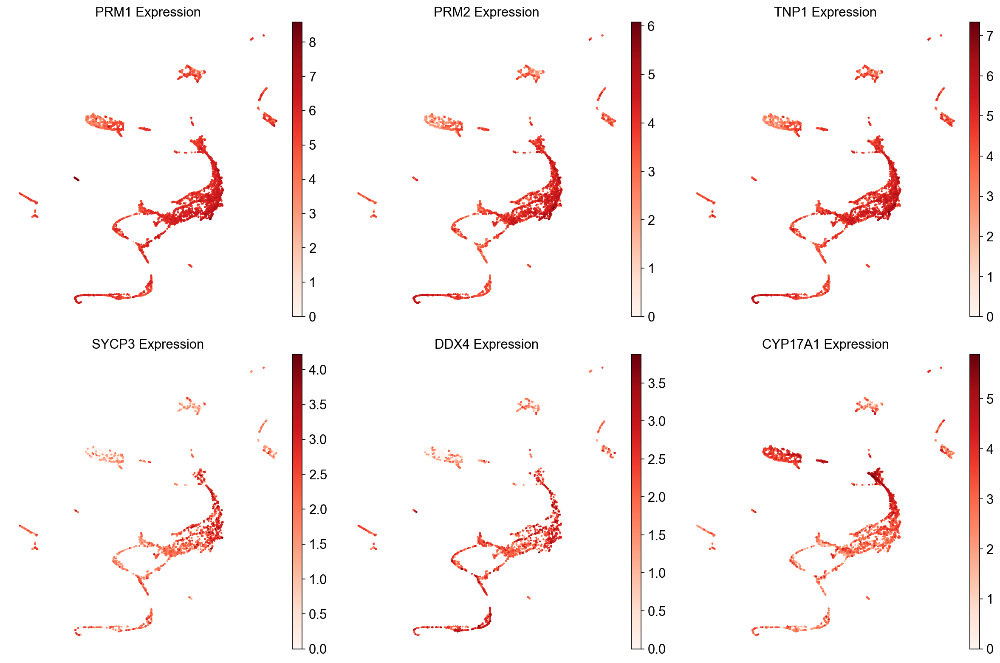

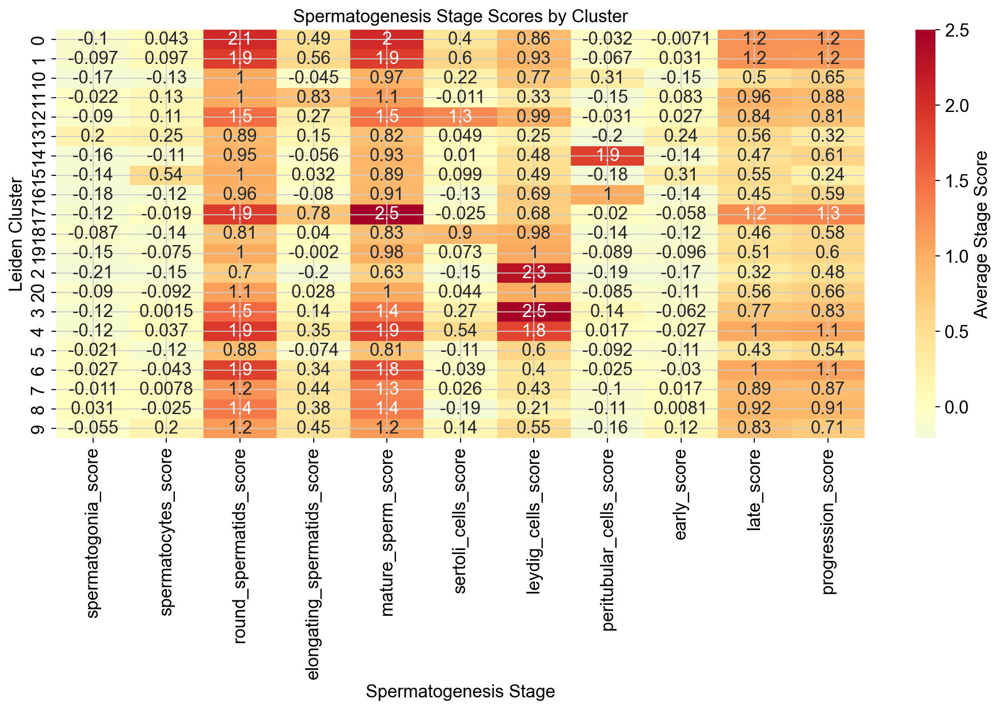

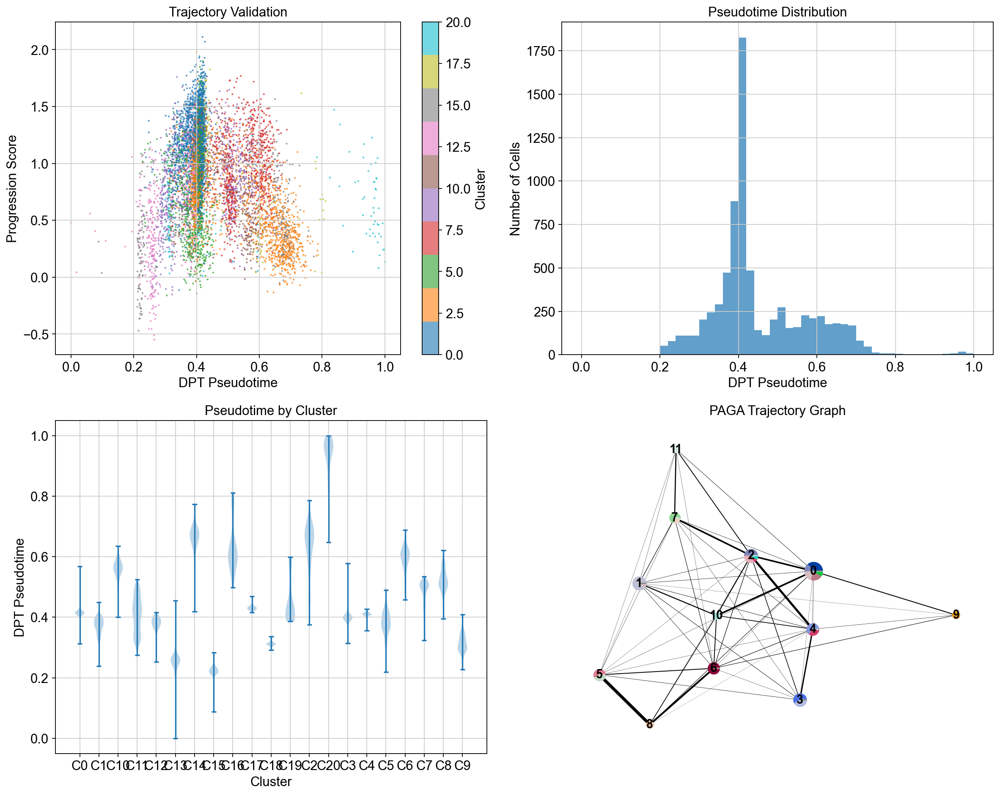


💾 EXPORTING RESULTS
✅ Results exported to: spermatogenesis_analysis_results

📋 ANALYSIS SUMMARY
📊 Final data: 7493 cells × 3025 features
🧬 Clusters identified: 21
📍 Annotated clusters: 21
   Cluster 1 (round_spermatids): 880 cells
   Cluster 11 (elongating_spermatids): 257 cells
   Cluster 3 (leydig_cells): 644 cells
   Cluster 7 (Unknown): 340 cells
   Cluster 6 (Unknown): 445 cells
   Cluster 0 (round_spermatids): 1055 cells
   Cluster 2 (Unknown): 800 cells
   Cluster 4 (round_spermatids): 574 cells
   Cluster 5 (Unknown): 505 cells
   Cluster 18 (Unknown): 62 cells
   Cluster 8 (Unknown): 322 cells
   Cluster 14 (peritubular_cells): 215 cells
   Cluster 12 (sertoli_cells): 256 cells
   Cluster 10 (Unknown): 279 cells
   Cluster 9 (Unknown): 304 cells
   Cluster 20 (Unknown): 50 cells
   Cluster 16 (Unknown): 70 cells
   Cluster 15 (spermatocytes): 96 cells
   Cluster 13 (spermatocytes): 217 cells
   Cluster 17 (elongating_spermatids): 68 cells
   Cluster 19 (Unknown): 54 cells
⏱️ 

'emptydrops_GSEA_results'

In [ ]:
bn = SpermatogenesisAnalyzer(data_path='/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/data/emptydrops_all_detected_cells.h5ad')
bdata = bn.run_complete_analysis()
bn.export_results(output_dir='emptydrops_GSEA_results')

# fast gene comparison plotter

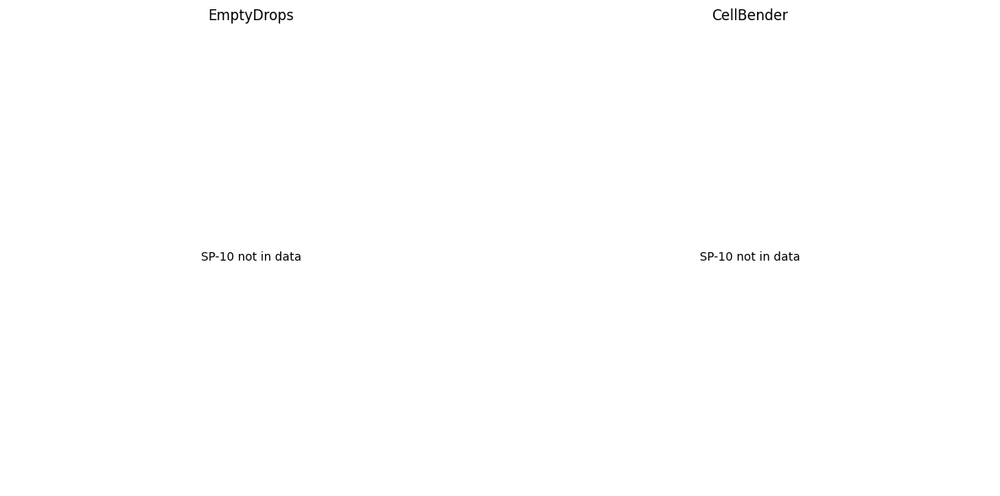

In [5]:
import scanpy as sc
import matplotlib.pyplot as plt

emptydrops_h5ad = '/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/GSEA_cellbender/GSEA_results/emptydropsRAW/processed_spermatogenesis_data.h5ad'
cellbender_h5ad = '/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/GSEA_cellbender/GSEA_results/cellbenderED/processed_spermatogenesis_data.h5ad'

adata_left  = sc.read_h5ad(emptydrops_h5ad)
adata_right = sc.read_h5ad(cellbender_h5ad)

def compare_gene_umap(gene, vmax=6, cmap='Reds',
                      left_title='EmptyDrops', right_title='CellBender',
                      outfile=None):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    for ax, ad, ttl in [(axes[0], adata_left, left_title), (axes[1], adata_right, right_title)]:
        if gene not in ad.var_names:
            ax.text(0.5, 0.5, f'{gene} not in data', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(ttl)
            ax.set_axis_off()
            continue
        sc.pl.umap(ad, color=gene, ax=ax, show=False, color_map=cmap, vmin=0, vmax=vmax, frameon=False)
        ax.set_title(f'{ttl}: {gene}')
    plt.tight_layout()
    if outfile:
        plt.savefig(outfile, dpi=300, bbox_inches='tight')
    plt.show()


gene = 'SP-10'
compare_gene_umap(gene, vmax=6, outfile=('GSEA_visualizations/comparison/compare_' + gene + '.png'))

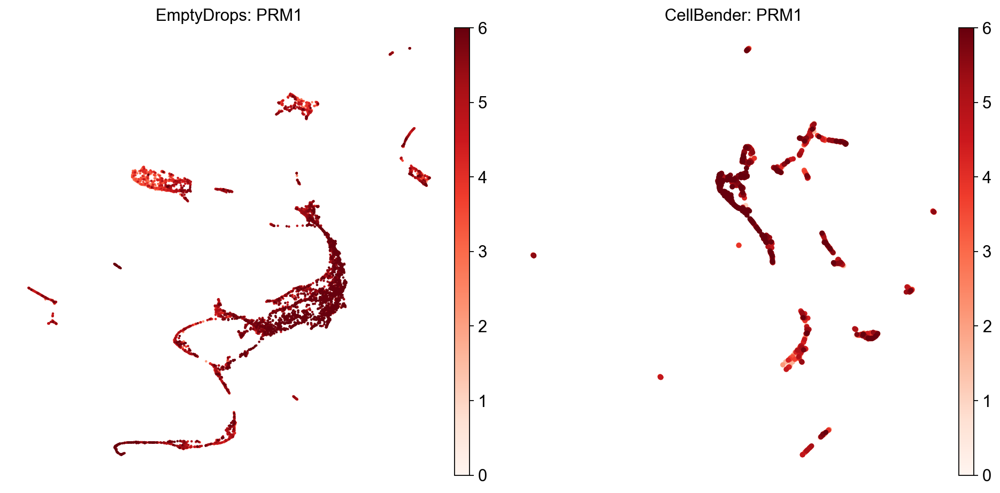

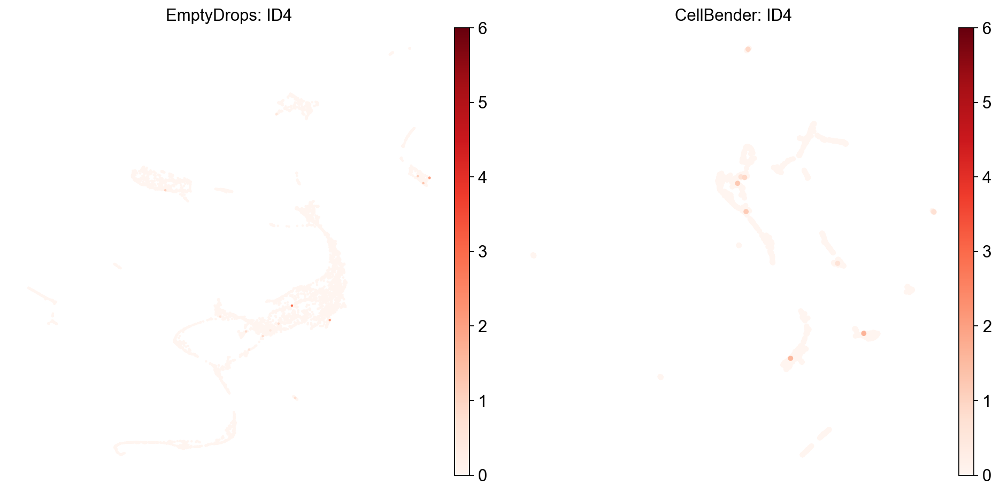

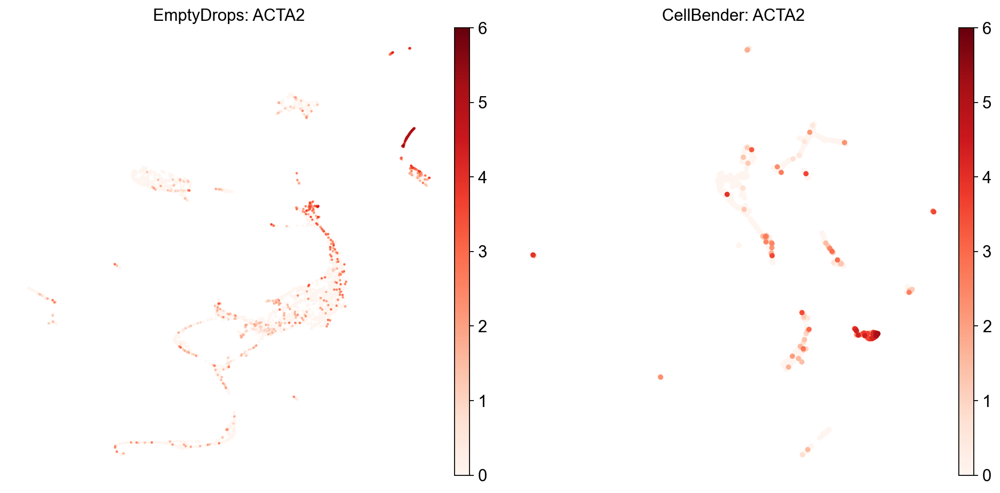

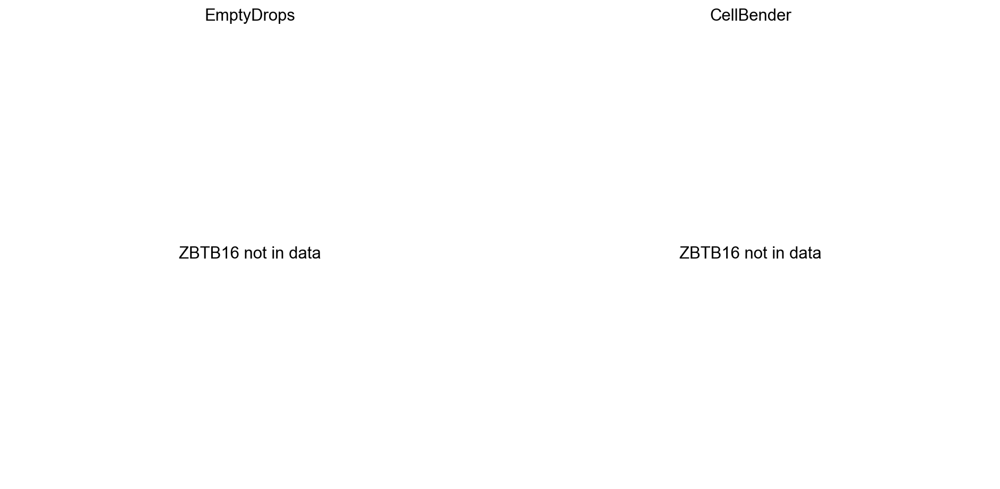

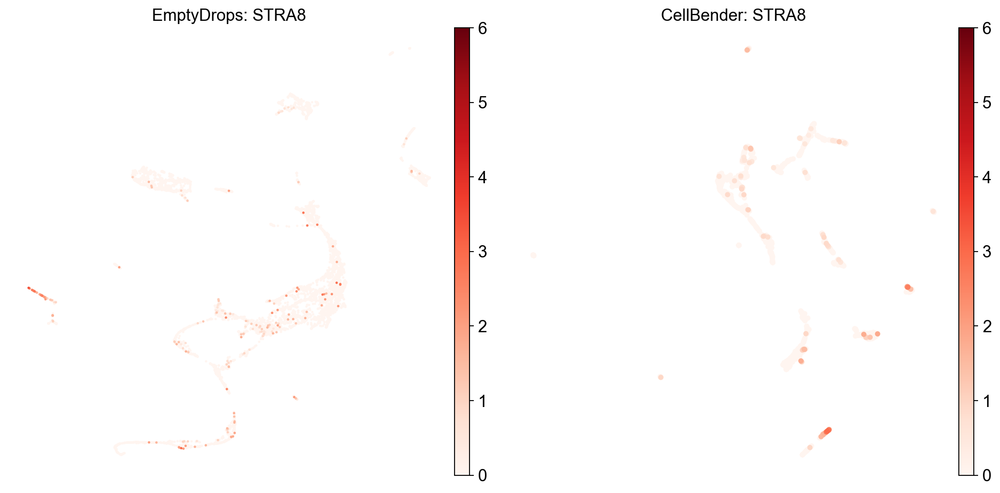

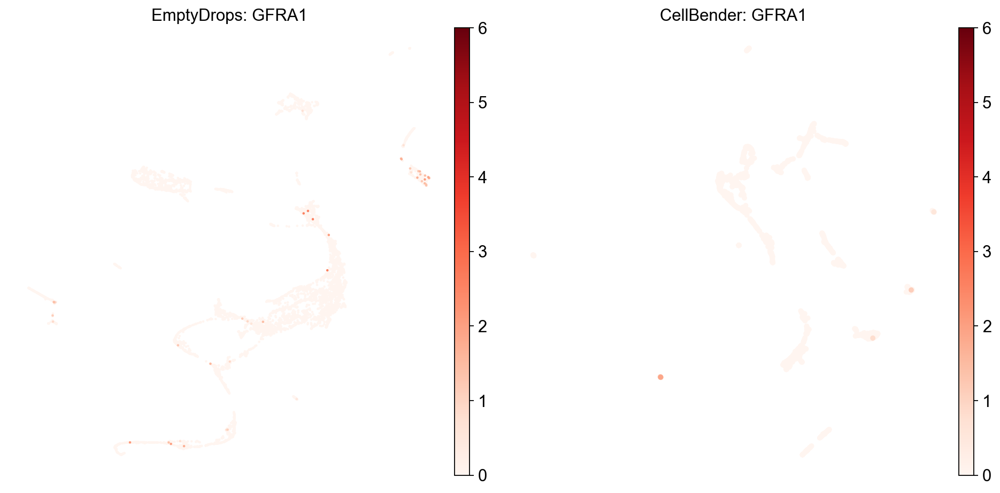

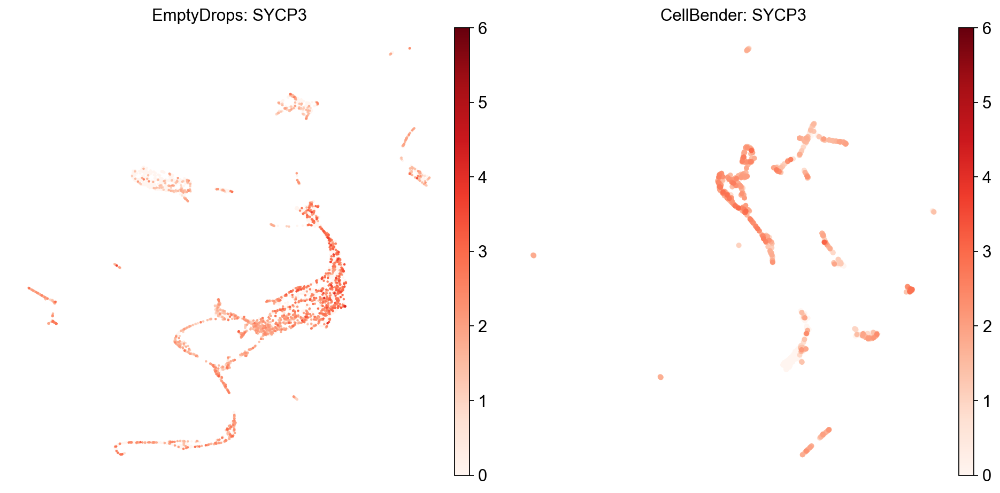

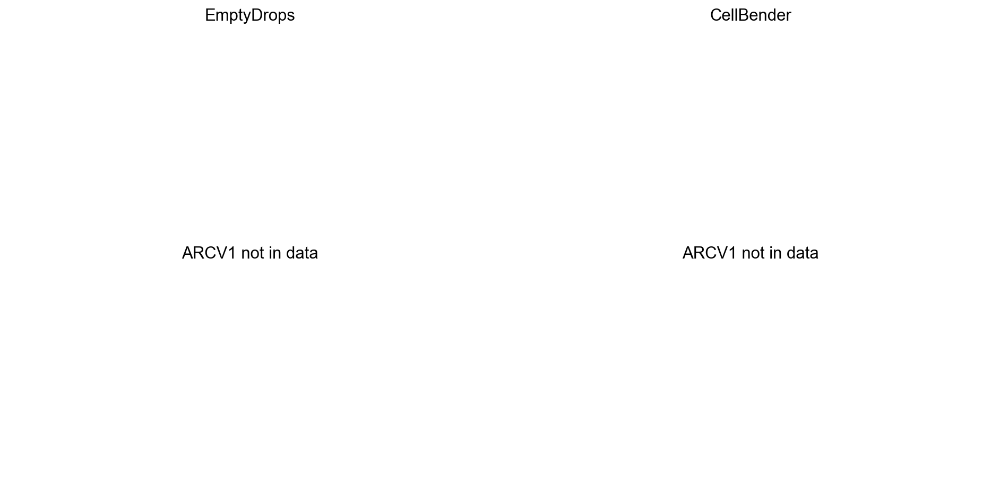

In [ ]:
# looping over list of genes and call per item the function above
for gene in ['PRM1', 'ID4', 'ACTA2', 'ZBTB16', 'STRA8', 'GFRA1', 'SYCP3', 'ARCV1']:
    compare_gene_umap(gene, vmax=6, outfile=('GSEA_visualizations/single_genes_comparison/compare_' + gene + '.png'))

UMI reduction data for interesting genes:
[(333604, 63.15), (9, 42.86), (4364, 65.82), (185, 44.79), (43, 63.24), (3131, 50.66)]


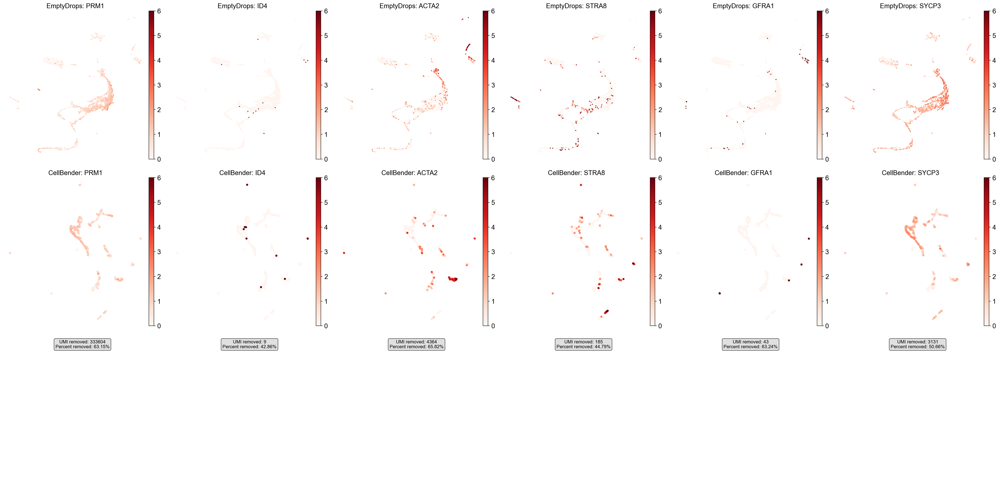

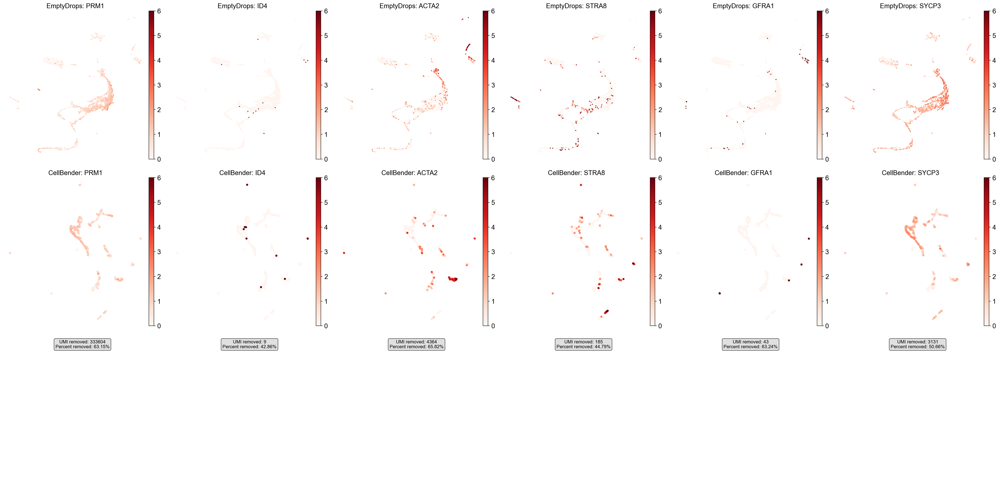

In [ ]:
interesting_genes = ['PRM1', 'ID4', 'ACTA2', 'STRA8', 'GFRA1', 'SYCP3']

umi_reduction_df = pd.read_csv('cellbender_results/emptydrops_genes_reduction.csv')

interesting_genes_umi_reduction = []
for gene in interesting_genes:
    gene_data = umi_reduction_df[umi_reduction_df['gene'] == gene]
    if not gene_data.empty:
        interesting_genes_umi_reduction.append((round(gene_data['umi_removed'].iloc[0]), round(gene_data['percent_removed'].iloc[0], 2)))
    else:
        print(f"Warning: {gene} not found in UMI reduction data")
        interesting_genes_umi_reduction.append((0, 0.0))

print("UMI reduction data for interesting genes:")
print(interesting_genes_umi_reduction)


def compare_genes_umap_grid(genes, vmax=6, vmin=0, cmap='Reds',
                            left_title='EmptyDrops', right_title='CellBender',
                            outfile=None, use_raw=False, umi_reduction_data=None):
    n = len(genes)
    fig, axes = plt.subplots(3, n, figsize=(5*n, 15))
    if n == 1:
        axes = np.array([[axes[0]], [axes[1]], [axes[2]]]) if isinstance(axes, np.ndarray) else np.array([[axes], [axes], [axes]])

    def _plot(ax, ad, gene, title):
        if gene not in ad.var_names:
            ax.text(0.5, 0.5, f'{gene} not found', ha='center', va='center', transform=ax.transAxes)
            ax.set_axis_off()
            return
        sc.pl.umap(ad, color=gene, ax=ax, show=False, color_map=cmap, vmin=vmin, vmax=vmax,
                   frameon=False, use_raw=use_raw)
        ax.set_title(f'{title}: {gene}')

    for j, g in enumerate(genes):
        _plot(axes[0, j], adata_left,  g, left_title)
        _plot(axes[1, j], adata_right, g, right_title)
        
        # Add UMI counts reduction data in the third row
        axes[2, j].axis('off')
        if umi_reduction_data and j < len(umi_reduction_data):
            umi_removed, percent_removed = umi_reduction_data[j]
            reduction_text = f'UMI removed: {umi_removed}\nPercent removed: {percent_removed}%'
            axes[2, j].text(0.5, 1, reduction_text, ha='center', va='center', 
                           transform=axes[2, j].transAxes, fontsize=10, 
                           bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.7))

    plt.tight_layout()
    if outfile:
        plt.savefig(outfile, dpi=300, bbox_inches='tight')
    return fig


compare_genes_umap_grid(interesting_genes, vmax=6, outfile='compare_emptydrops_vs_cellbender.png', 
                       use_raw=False, umi_reduction_data=interesting_genes_umi_reduction)

# cn = F_cellbender

🧬 Defined 54 trajectory markers
📊 Cell type markers: 78 total
🚀 STARTING COMPREHENSIVE SPERMATOGENESIS ANALYSIS
📁 Loading data from: /Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/GSEA_cellbender/data/filtered_feature_bc_matrix_cellbender.h5
📊 Original data shape: (2701, 22040)
✅ Data loaded and QC metrics calculated

🔍 ADVANCED FILTERING
Original: 2701 cells × 22040 genes
After min_genes filter: 469 cells
After gene filter: 14448 genes
✅ Final filtered data: 415 cells × 14448 genes


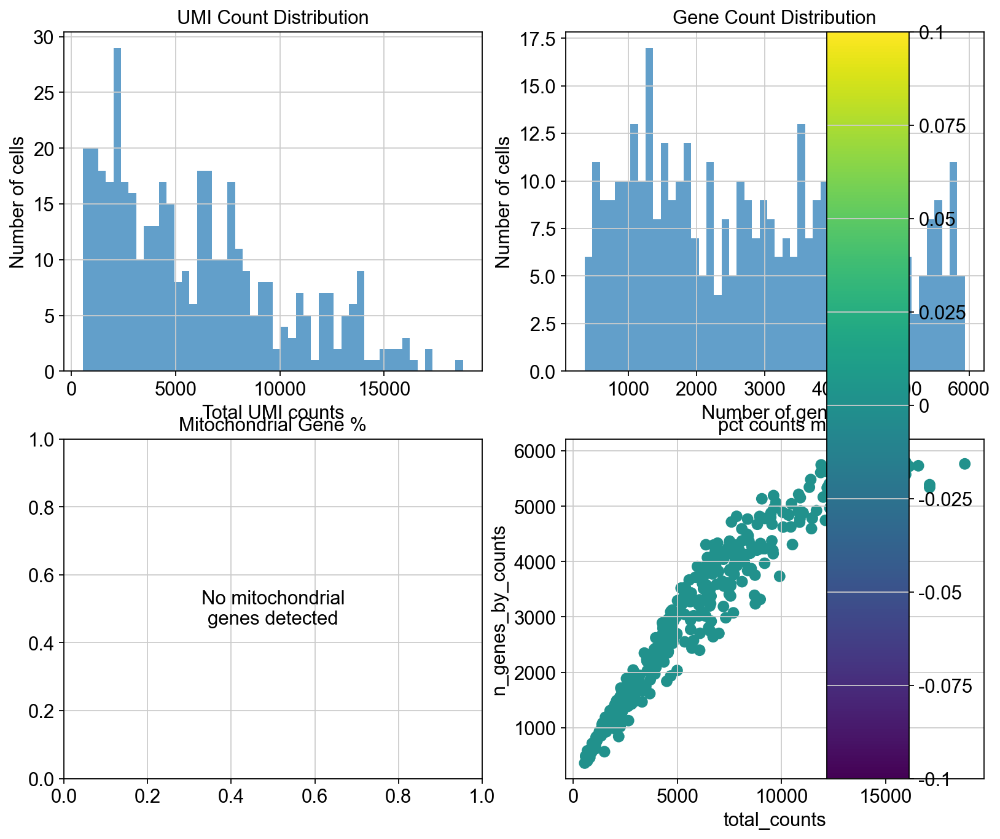

<Figure size 960x640 with 0 Axes>


🔧 NORMALIZATION & SCALING
📊 Highly variable genes: 3000


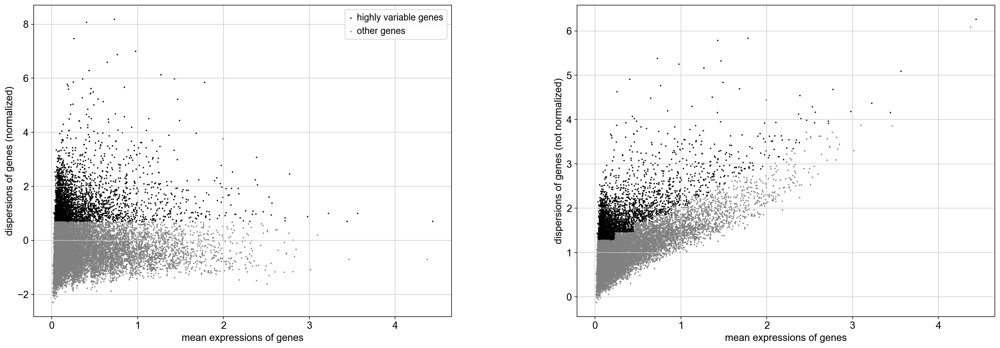

🧬 Available spermatogenesis markers: 37
🎯 HVG spermatogenesis markers: 11
Key HVG markers: ['KIT', 'STRA8', 'DMRT1', 'SYCP1', 'SMC1B', 'REC8', 'SPO11', 'DMC1', 'CCNB1', 'TNP1']
✅ Normalized and scaled: 3026 features

🌟 ADVANCED DIMENSIONALITY REDUCTION
🔄 Computing diffusion maps...
🕸️ Computing PAGA...
🗺️ Computing UMAP with PAGA initialization...
🌊 Computing diffusion-based UMAP...
✅ Dimensionality reduction completed

🧬 SPERMATOGENESIS TRAJECTORY INFERENCE
📊 spermatogonia: 4 markers available
📊 spermatocytes: 13 markers available
📊 round_spermatids: 8 markers available
📊 elongating_spermatids: 10 markers available
📊 mature_sperm: 5 markers available
📊 sertoli_cells: 4 markers available
📊 leydig_cells: 4 markers available
📊 peritubular_cells: 5 markers available
🌱 Root cluster set: 1
✅ Trajectory inference completed

🧪 GSEA PATHWAY ANALYSIS
📊 Progression groups: progression_group
EARLY    208
LATE     207
Name: count, dtype: int64
🔍 Running GSEA with GO_Biological_Process_2023...
✅ GO

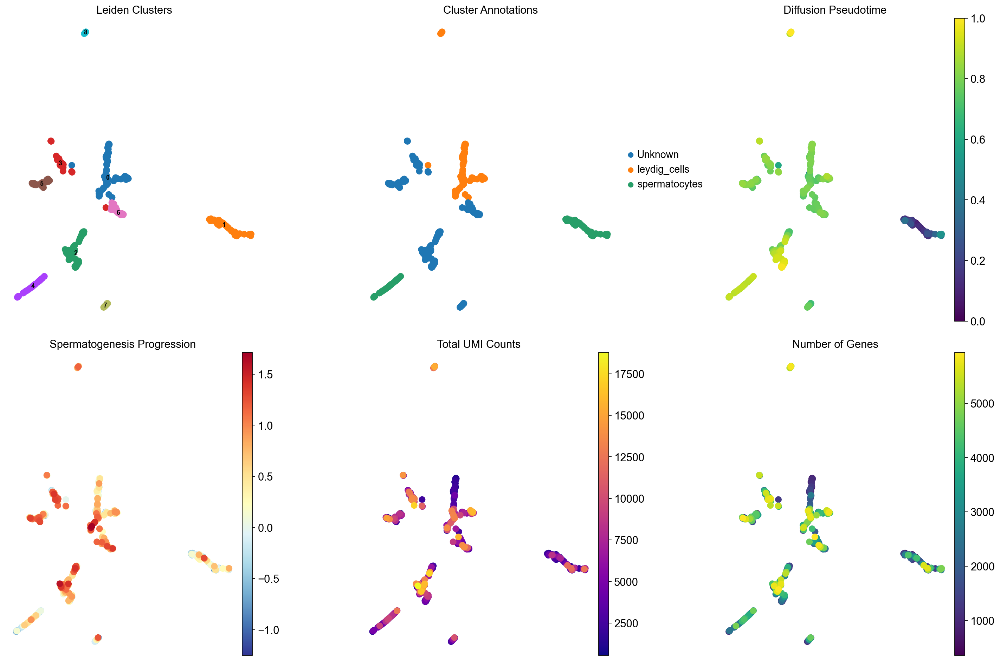

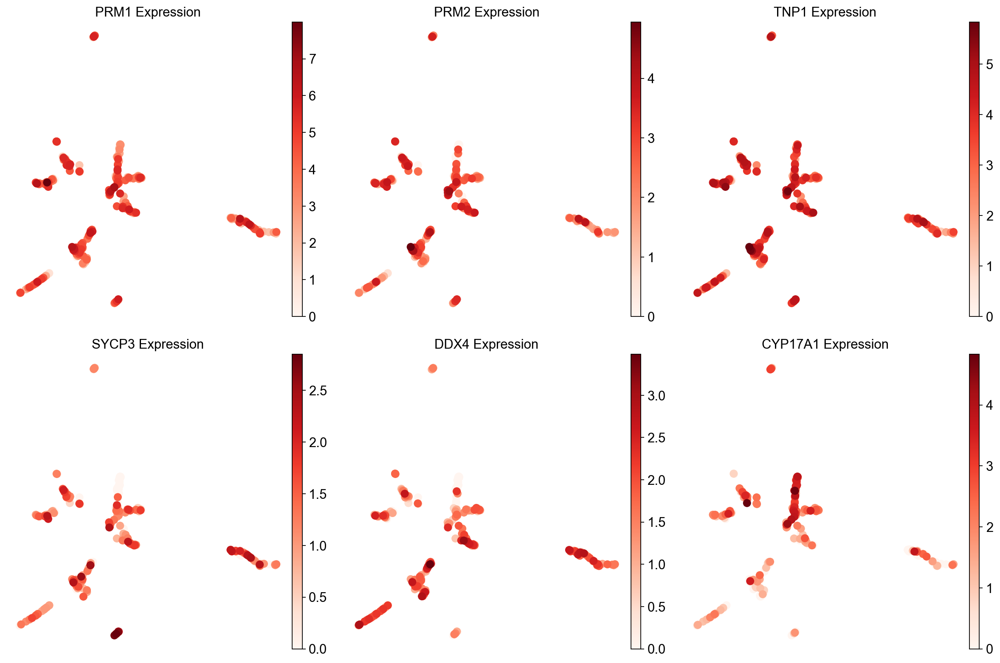

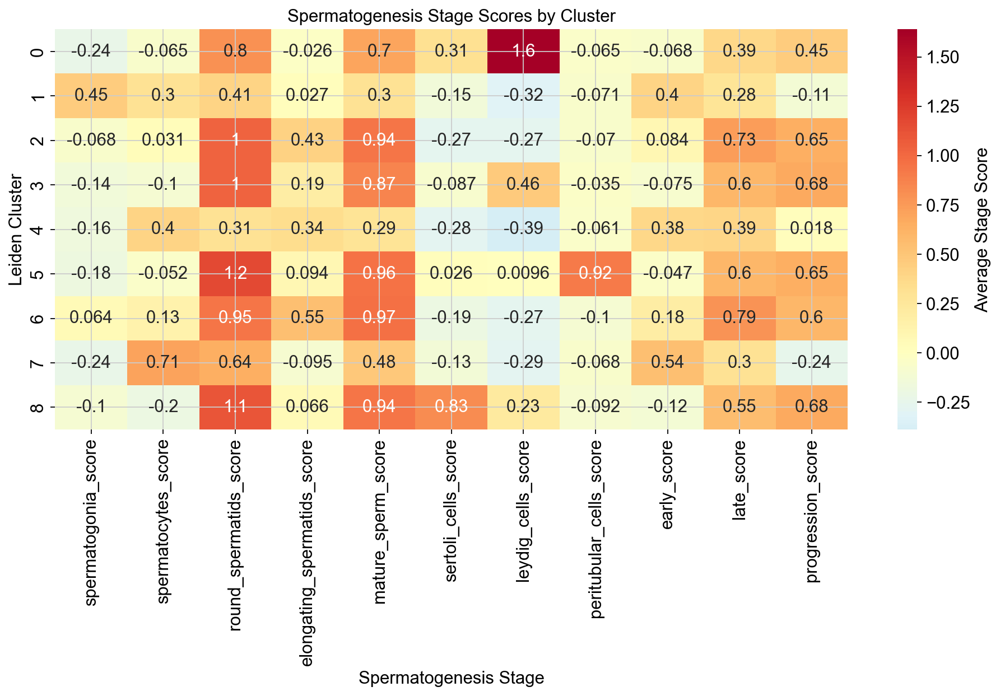

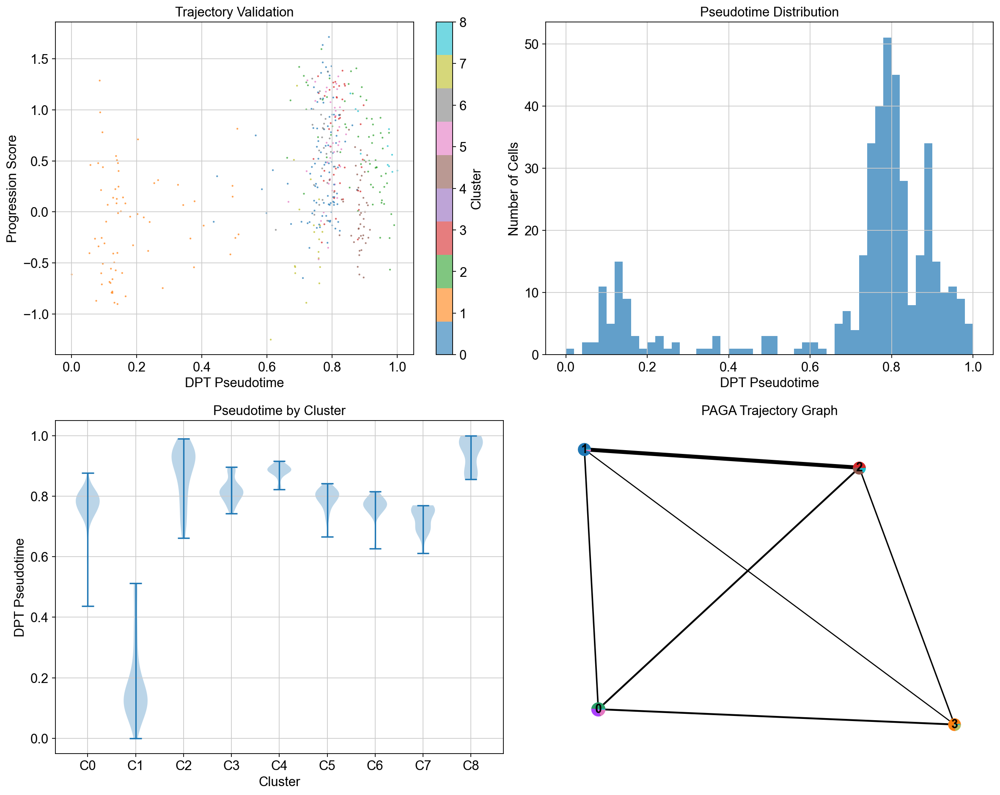


💾 EXPORTING RESULTS
✅ Results exported to: spermatogenesis_analysis_results

📋 ANALYSIS SUMMARY
📊 Final data: 415 cells × 3026 features
🧬 Clusters identified: 9
📍 Annotated clusters: 9
   Cluster 3 (Unknown): 45 cells
   Cluster 4 (spermatocytes): 43 cells
   Cluster 2 (Unknown): 66 cells
   Cluster 0 (leydig_cells): 97 cells
   Cluster 6 (Unknown): 29 cells
   Cluster 1 (spermatocytes): 69 cells
   Cluster 5 (Unknown): 36 cells
   Cluster 8 (leydig_cells): 11 cells
   Cluster 7 (Unknown): 19 cells
⏱️ Pseudotime range: 0.000 - 1.000
🧪 GSEA databases: 4

🎉 ANALYSIS COMPLETE!
📁 Results saved to: spermatogenesis_analysis_results

💾 EXPORTING RESULTS
✅ Results exported to: GSEA_results/filtered_GSEA_results

📋 ANALYSIS SUMMARY
📊 Final data: 415 cells × 3026 features
🧬 Clusters identified: 9
📍 Annotated clusters: 9
   Cluster 3 (Unknown): 45 cells
   Cluster 4 (spermatocytes): 43 cells
   Cluster 2 (Unknown): 66 cells
   Cluster 0 (leydig_cells): 97 cells
   Cluster 6 (Unknown): 29 cells
 

'GSEA_results/filtered_GSEA_results'

In [6]:
cn = SpermatogenesisAnalyzer(data_path='/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/GSEA_cellbender/data/filtered_feature_bc_matrix_cellbender.h5')
cdata = cn.run_complete_analysis()
cn.export_results(output_dir='GSEA_results/filtered_GSEA_results')


UMI reduction data for interesting genes:
[(333604, 63.15), (9, 42.86), (4364, 65.82), (185, 44.79), (43, 63.24), (3131, 50.66)]


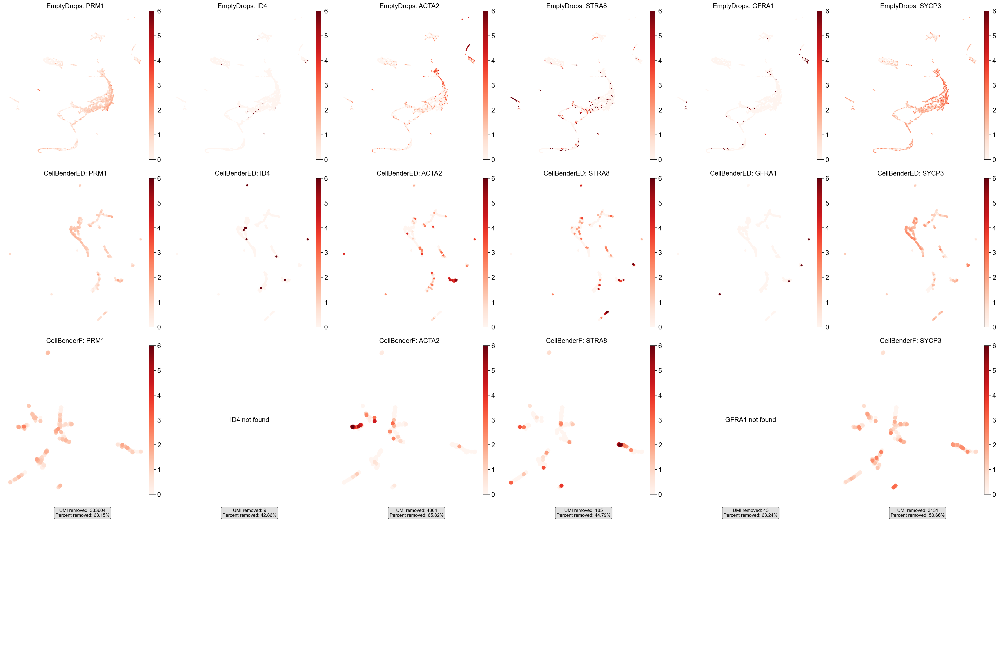

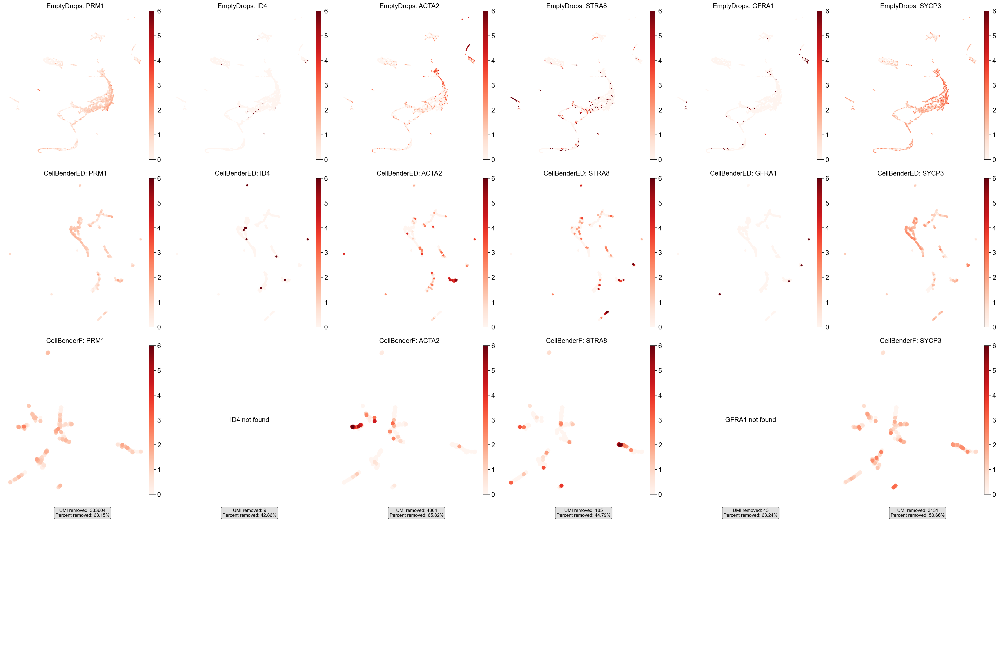

In [11]:
import scanpy as sc
import matplotlib.pyplot as plt

emptydrops_h5ad = '/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/GSEA_cellbender/GSEA_results/emptydropsRAW/processed_spermatogenesis_data.h5ad'
cellbenderED_h5ad = '/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/GSEA_cellbender/GSEA_results/cellbenderED/processed_spermatogenesis_data.h5ad'
cellbenderF_h5ad = '/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/GSEA_cellbender/GSEA_results/cellbenderFILT/processed_spermatogenesis_data.h5ad'

adata_left  = sc.read_h5ad(emptydrops_h5ad)
adata_middle = sc.read_h5ad(cellbenderED_h5ad)
adata_right = sc.read_h5ad(cellbenderF_h5ad)

def compare_gene_umap(gene, vmax=6, cmap='Reds',
                      left_title='EmptyDrops', middle_title='CellBenderED', right_title='CellBenderF',
                      outfile=None):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    for ax, ad, ttl in [(axes[0], adata_left, left_title), (axes[1], adata_middle, middle_title), (axes[2], adata_right, right_title)]:
        if gene not in ad.var_names:
            ax.text(0.5, 0.5, f'{gene} not in data', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(ttl)
            ax.set_axis_off()
            continue
        sc.pl.umap(ad, color=gene, ax=ax, show=False, color_map=cmap, vmin=0, vmax=vmax, frameon=False)
        ax.set_title(f'{ttl}: {gene}')
    plt.tight_layout()
    if outfile:
        plt.savefig(outfile, dpi=300, bbox_inches='tight')
    plt.show()


interesting_genes = ['PRM1', 'ID4', 'ACTA2', 'STRA8', 'GFRA1', 'SYCP3']

umi_reduction_df = pd.read_csv('cellbender_results/emptydrops_genes_reduction.csv')

interesting_genes_umi_reduction = []
for gene in interesting_genes:
    gene_data = umi_reduction_df[umi_reduction_df['gene'] == gene]
    if not gene_data.empty:
        interesting_genes_umi_reduction.append((round(gene_data['umi_removed'].iloc[0]), round(gene_data['percent_removed'].iloc[0], 2)))
    else:
        print(f"Warning: {gene} not found in UMI reduction data")
        interesting_genes_umi_reduction.append((0, 0.0))

print("UMI reduction data for interesting genes:")
print(interesting_genes_umi_reduction)


def compare_genes_umap_grid(genes, vmax=6, vmin=0, cmap='Reds',
                            left_title='EmptyDrops', middle_title='CellBenderED', right_title='CellBenderF',
                            outfile=None, use_raw=False, umi_reduction_data=None):
    n = len(genes)
    fig, axes = plt.subplots(4, n, figsize=(5*n, 20))
    if n == 1:
        axes = np.array([[axes[0]], [axes[1]], [axes[2]], [axes[3]]]) if isinstance(axes, np.ndarray) else np.array([[axes], [axes], [axes], [axes]])

    def _plot(ax, ad, gene, title):
        if gene not in ad.var_names:
            ax.text(0.5, 0.5, f'{gene} not found', ha='center', va='center', transform=ax.transAxes)
            ax.set_axis_off()
            return
        sc.pl.umap(ad, color=gene, ax=ax, show=False, color_map=cmap, vmin=vmin, vmax=vmax,
                   frameon=False, use_raw=use_raw)
        ax.set_title(f'{title}: {gene}')

    for j, g in enumerate(genes):
        _plot(axes[0, j], adata_left,  g, left_title)
        _plot(axes[1, j], adata_middle, g, middle_title)
        _plot(axes[2, j], adata_right, g, right_title)
        
        # Add UMI counts reduction data in the fourth row
        axes[3, j].axis('off')
        if umi_reduction_data and j < len(umi_reduction_data):
            umi_removed, percent_removed = umi_reduction_data[j]
            reduction_text = f'UMI removed: {umi_removed}\nPercent removed: {percent_removed}%'
            axes[3, j].text(0.5, 1, reduction_text, ha='center', va='center', 
                           transform=axes[3, j].transAxes, fontsize=10, 
                           bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.7))

    plt.tight_layout()
    if outfile:
        plt.savefig(outfile, dpi=300, bbox_inches='tight')
    return fig


compare_genes_umap_grid(interesting_genes, vmax=6, outfile='compare_emptydrops_vs_cellbenderED_vs_cellbenderF.png', 
                       use_raw=False, umi_reduction_data=interesting_genes_umi_reduction)